# <u>**Project - Data Science**<u>

<br>

|Group Members|
|---|
|Omar Ennouri|
|Khouloud Gharbi|
|Bruno Colque|
|Mohamed Amine Mroua|
|Mahdi Ghamgui|




# **Deliverable 2 - Image Processing**

 **Context**

 In a large image database, there are always unusable images because they are of poor quality or contain noise.

 The goal of this deliverable is to be able to **denoise** input images.
 This means removing the noise from the image so that it becomes readable and usable afterward.

 To achieve this, we will create and train an **autoencoder** model to remove noise from an image dataset.

 An autoencoder is an **unsupervised** learning model, which means that we won't have any labels to know if it is right or wrong.
 To train, it will **compare** its output with a non-noisy version of the same image.

 The principle of the autoencoder is simple, it consists of an **encoder** and a **decoder**.

 The **encoder** will reduce the size of the image using multiple convolutional and pooling layers,
 retaining only the essential features of the image, known as the "**latent space**."

 The **decoder**, on the other hand, will do the reverse: it will take the essence of the image produced by the encoder
 and enlarge it using multiple convolutional and upsampling layers.

 This process allows the model to keep only the essential features of the image, thereby **removing** unnecessary pixels,
 i.e., the "noise."

 The result is a **reconstructed** image.


## **Mounting Google Drive in Google Colab**

 To access the files stored on your Google Drive from Google Colab,
 you first need to mount your Drive.
 This will allow you to easily access your files in the `/content/drive` directory.

 Use the following code to mount your Google Drive:


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Code Explanation

This code sets up the necessary imports for building and training machine learning models using TensorFlow, Keras, and OpenCV. It includes tools for handling images, data splitting, and preprocessing. Here's a breakdown:

## Imports

- **TensorFlow/Keras Imports**: Provides deep learning functionalities, including layers, models, optimizers, losses, and metrics. Used for building, training, and evaluating models.
- **Numpy/Pandas**: Utilized for numerical operations and data manipulation.
- **Matplotlib**: Used for visualizing data and model performance.
- **OpenCV (cv2)**: Allows image manipulation and processing.
- **Scikit-learn**: Provides tools for splitting datasets into training and testing sets.
- **Autoencoder Setup**: Defines imports specific to building convolutional autoencoders for image denoising (e.g., `Conv2D`, `MaxPooling2D`, `UpSampling2D`).
- **EarlyStopping Callback**: Ensures the model stops training when performance stops improving.
- **Miscellaneous**: Suppresses warnings and imports helper libraries for randomization and file handling.

This is the initial setup phase before building and training machine learning models.


In [ ]:
# For ML Models
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.losses import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.metrics import *
from tensorflow.keras import regularizers
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing.image import load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping

%matplotlib inline

# Pour le traitement des données
import numpy as np

# Pour la visualisation des données
import matplotlib.pyplot as plt

# Divers
import os
import random

# Désactivez les avertissements
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'



## Dataset Exploration

In this section, we will explore the dataset by loading all the `.jpg` images present in a specific directory. We will also display information about the first image in the dataset.

### Key Steps:

1. **Importing Libraries**:
   - We import `os` to manage file paths and `PIL` (Pillow) to manipulate images.

2. **Loading Image Paths**:
   - We define the main directory and retrieve all paths of `.jpg` files in that directory.

3. **Displaying the Total Number of Images**:
   - The total number of images found will be displayed.

4. **Displaying Information About the First Image**:
   - We will open the first image and display its format and mode.


In [ ]:
import os
from PIL import Image

# Obtenir tous les chemins des images .jpg dans le répertoire principal
main_dir = '/content/drive/MyDrive/Dataset/'
all_image_paths = [os.path.join(main_dir, file) for file in os.listdir(main_dir) if file.endswith('.jpg')]

print('Total number of images:', len(all_image_paths))

# Afficher les informations sur la première image
img = Image.open(all_image_paths[0])
print(f"Image format: {img.format}")
print(f"Image mode: {img.mode}")


Total number of images: 148
Image format: JPEG
Image mode: RGB


# Verify Dimensions

In this section, we will verify the dimensions of the images in our dataset by collecting the sizes of all `.jpg` images. We will then check if there are any different dimensions among the images.

### Key Steps:

1. **Initializing a List**:
   - We start by initializing an empty list called `image_sizes` to store the dimensions of each image.

2. **Iterating Through Image Paths**:
   - For each image path in our dataset, we open the image using `PIL` and append its size (width, height) to the `image_sizes` list.

3. **Checking for Unique Dimensions**:
   - We use a set to identify unique image sizes. A set automatically removes duplicates, allowing us to easily see if there are any different dimensions among the images.


In [ ]:
# Initialiser une liste pour stocker les tailles des images
image_sizes = []

for path in all_image_paths:
    with Image.open(path) as img:
        image_sizes.append(img.size)

# Vérifier s'il y a des dimensions différentes
unique_sizes = set(image_sizes)
print(f"Unique image sizes: {unique_sizes}")


Unique image sizes: {(354, 500), (612, 612), (600, 464), (473, 640), (550, 640), (640, 332), (640, 518), (640, 463), (500, 337), (640, 640), (480, 252), (500, 419), (640, 426), (640, 429), (424, 640), (501, 640), (640, 258), (640, 453), (500, 333), (640, 462), (375, 500), (640, 233), (640, 413), (428, 640), (426, 640), (640, 480), (640, 419), (640, 425), (480, 640), (640, 544), (500, 299), (640, 428), (640, 498), (333, 500), (640, 562), (500, 375), (640, 626), (500, 500), (640, 278), (482, 500), (564, 640), (500, 335), (640, 580), (640, 345), (518, 600), (427, 640), (500, 353), (482, 640), (640, 482), (640, 427), (640, 424), (640, 430), (640, 494), (500, 374)}


# Resizing Images

In this section, we will resize all `.jpg` images in our dataset to a uniform size of 256x256 pixels. This process is essential for ensuring consistency in image dimensions, which is particularly important for tasks such as machine learning, where uniform input sizes are required.

### Key Steps:

1. **Creating a Directory for Resized Images**:
   - We define a directory path (`resized_dir`) where the resized images will be saved and create this directory if it doesn't already exist.

2. **Iterating Through Image Paths**:
   - For each image path in our dataset, we open the image using `PIL`.

3. **Resizing the Images**:
   - Each image is resized to 256x256 pixels using the `resize` method.

4. **Saving the Resized Images**:
   - The resized images are saved in the newly created directory, maintaining their original filenames.


In [ ]:
resized_dir = '/content/drive/MyDrive/Dataset_Resized/'
os.makedirs(resized_dir, exist_ok=True)

for path in all_image_paths:
    with Image.open(path) as img:
        # Redimensionner l'image à 256x256
        img_resized = img.resize((256, 256))
        # Enregistrer l'image redimensionnée dans le répertoire de sortie
        img_name = os.path.basename(path)
        img_resized.save(os.path.join(resized_dir, img_name))

print(f"Images resized and saved to: {resized_dir}")


Images resized and saved to: /content/drive/MyDrive/Dataset_Resized/


### Interpretation

By executing the above code, we resize all the images in our dataset to a standard size of 256x256 pixels. This resizing process serves several purposes:

- **Uniformity**: It ensures that all images have the same dimensions, which is crucial for many image processing tasks and machine learning models that require fixed input sizes.

- **Efficiency**: Smaller image sizes can reduce computational load, speeding up processing times during training or inference.

- **Improved Performance**: Consistent image sizes can enhance the performance of models by minimizing variations that could confuse the learning algorithms.

# Displaying Original and Resized Images

In this section, we will visually compare the original and resized images side by side. This helps us assess the effects of resizing on image quality and dimensions.

The code imports the necessary library, defines a function to display images, and selects an original image along with its resized version. Both images are then displayed in a single figure for easy comparison.

### Code:

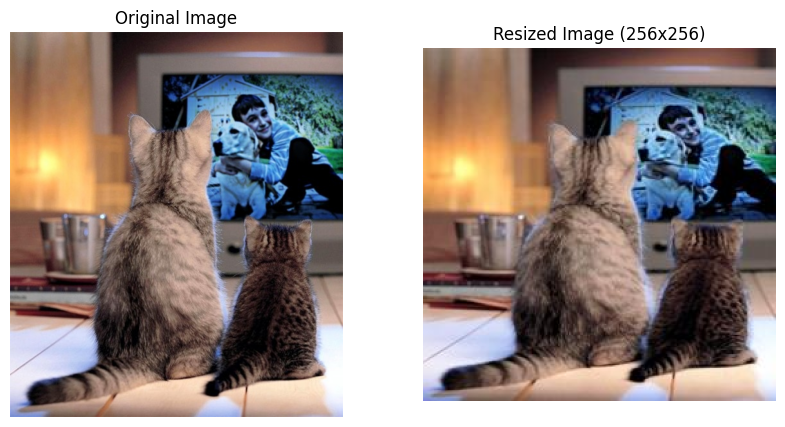

In [ ]:
import matplotlib.pyplot as plt

def show_image(image_path, title=''):
    with Image.open(image_path) as img:
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')

# Afficher l'image originale et redimensionnée pour un exemple
original_img_path = all_image_paths[0]
resized_img_path = os.path.join(resized_dir, os.path.basename(original_img_path))

plt.figure(figsize=(10, 5))

# Image originale
plt.subplot(1, 2, 1)
show_image(original_img_path, 'Original Image')

# Image redimensionnée
plt.subplot(1, 2, 2)
show_image(resized_img_path, 'Resized Image (256x256)')

plt.show()


### Interpretation

This visualization allows us to assess the impact of resizing on image quality. By displaying the original and resized images side by side, we can observe any changes in clarity, detail, and overall appearance. Such visual comparisons are crucial for ensuring that the resizing process maintains acceptable image quality for subsequent analysis or model training.


# Detecting and Removing Duplicate Images

In this section, we implement a method to detect and remove duplicate images from our dataset using the perceptual hashing technique. This technique helps us identify visually similar images even if they are not bit-for-bit identical.

### Code Explanation:

1. **Hash Function**:
   - We define a function `dhash` that computes a perceptual hash for an image. The image is converted to grayscale and resized, allowing us to generate a hash based on the differences between adjacent pixel values.

2. **Hash Dictionary**:
   - We create a dictionary (`hash_dict`) to store hashes of images and a list (`duplicates`) to keep track of any duplicates detected.

3. **Image Processing**:
   - We iterate through all the images in our dataset. For each image, we calculate its hash and check if it already exists in the hash dictionary. If it does, we add the image path to the duplicates list; otherwise, we store the hash along with its corresponding image path.

4. **Removing Duplicates**:
   - After identifying duplicates, we attempt to remove them from the filesystem, counting how many duplicates have been successfully deleted.

In [ ]:
import os
import hashlib
from PIL import Image, ImageOps
import numpy as np

def dhash(image, hash_size=8):
    # Convertir l'image en niveau de gris et la redimensionner avec LANCZOS (anciennement ANTIALIAS)
    image = image.convert('L').resize((hash_size + 1, hash_size), Image.Resampling.LANCZOS)

    # Calculer les différences entre les pixels
    diff = np.array(image)[:, 1:] > np.array(image)[:, :-1]

    # Convertir les différences en hash
    return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v])

# Dictionnaire pour stocker les hashes d'images
hash_dict = {}
duplicates = []

# Parcourir toutes les images pour détecter les doublons
for path in all_image_paths:
    with Image.open(path) as img:
        img_hash = dhash(img)

        # Vérifier si le hash existe déjà
        if img_hash in hash_dict:
            duplicates.append((path, hash_dict[img_hash]))
        else:
            hash_dict[img_hash] = path

# Supprimer les images en double et compter combien ont été supprimées
removed_count = 0
for dup in duplicates:
    try:
        os.remove(dup[0])  # Supprimer l'image en double (le premier élément du tuple)
        removed_count += 1
        print(f"Removed duplicate image: {dup[0]}")
    except Exception as e:
        print(f"Error removing {dup[0]}: {e}")

# Afficher le nombre de duplicatas supprimés
print(f"Total duplicates removed: {removed_count}")


Total duplicates removed: 0


### Interpretation

This code effectively detects and removes duplicate images from the dataset, ensuring that we work with a cleaner collection of images. By employing a perceptual hashing method, we can identify visually similar images, which might not be identical in their pixel data but represent the same content. Removing duplicates helps reduce redundancy, saves storage space, and improves the efficiency of subsequent analyses or machine learning tasks. After running this code, we can confirm how many duplicate images were removed, thus maintaining the integrity and quality of our dataset.


### Data Augmentation for Improved Model Robustness

Given that we have a relatively small dataset, we have decided to implement data augmentation.

This code utilizes the **Augmentor** library to enrich an image dataset by applying various augmentations. The `apply_augmentations()` function is designed to accept an input directory of images and an output directory, along with several parameters to configure the desired types of augmentations. These augmentations include transformations such as rotation, horizontal flipping, zooming, and adjustments of contrast and brightness. By diversifying the original images, this process helps improve the robustness of a machine learning model, allowing it to generalize better to unseen data.

The function creates a pipeline of augmentations, where each type of transformation is applied with a specified probability. This enables the generation of unique variations of the original images, effectively increasing the size of the dataset. In the given example, 120 augmented images are created from a specified input directory and saved to a new directory. This augmentation strategy is particularly beneficial in computer vision tasks, where data diversity can significantly impact model performance, reducing the risk of overfitting and enhancing the model's ability to generalize across various use cases.


In [ ]:
!pip install Augmentor
import Augmentor
def apply_augmentations(input_dir, output_dir, num_samples, rotation_range=25, flip_probability=0.5,
                        zoom_probability=0.5, zoom_percentage=0.8, contrast_probability=0.5,
                        contrast_min_factor=0.8, contrast_max_factor=1.2, brightness_probability=0.5,
                        brightness_min_factor=0.8, brightness_max_factor=1.2, color_probability=0.5,
                        color_min_factor=0.8, color_max_factor=1.2, distortion_probability=0.5,
                        grid_width=4, grid_height=4, distortion_magnitude=8, erasing_probability=0.5,
                        erasing_area=0.2):
    # Create an Augmentor pipeline with specified parameters
    p = Augmentor.Pipeline(source_directory=input_dir, output_directory=output_dir)

    # Define augmentations with provided parameters
    p.rotate(probability=0.7, max_left_rotation=rotation_range, max_right_rotation=rotation_range)
    p.flip_left_right(probability=flip_probability)
    p.zoom_random(probability=zoom_probability, percentage_area=zoom_percentage)
    p.random_contrast(probability=contrast_probability, min_factor=contrast_min_factor, max_factor=contrast_max_factor)
    p.random_brightness(probability=brightness_probability, min_factor=brightness_min_factor,
                        max_factor=brightness_max_factor)

    # Apply color-related augmentations
    p.random_color(probability=color_probability, min_factor=color_min_factor, max_factor=color_max_factor)

    p.random_distortion(probability=distortion_probability, grid_width=grid_width, grid_height=grid_height,
                        magnitude=distortion_magnitude)
    p.random_erasing(probability=erasing_probability, rectangle_area=erasing_area)

    # Sample 'num_samples' augmented images
    p.sample(num_samples)
# Example usage
input_directory = "/content/drive/MyDrive/Dataset/"
output_directory = "/content/extracted_files/Datasetaugmente/"
num_samples = 150  # Number of augmented images to generate

apply_augmentations(input_directory, output_directory, num_samples)


Initialised with 148 image(s) found.
Output directory set to /content/extracted_files/Datasetaugmente/.

Processing <PIL.Image.Image image mode=RGB size=640x419 at 0x7F25D90B2EC0>: 100%|██████████| 150/150 [00:09<00:00, 16.10 Samples/s]


# Resizing Augmented Images

In this section, we will resize the augmented images to ensure they conform to a standard size. This step is crucial for maintaining consistency across our dataset and ensuring compatibility with the model inputs.



In [ ]:
import os
from PIL import Image

# Chemins des répertoires
augmented_dir = "/content/extracted_files/Datasetaugmente/"
resized_dir = "/content/extracted_files/Datasetaugmente_resized/"
target_size = (256, 256)  # Taille de redimensionnement

# Créer le répertoire de sortie si nécessaire
os.makedirs(resized_dir, exist_ok=True)

# Obtenir tous les chemins des images dans le répertoire augmenté
augmented_image_paths = [os.path.join(augmented_dir, file) for file in os.listdir(augmented_dir) if file.endswith('.jpg')]

# Redimensionner et sauvegarder les images
for path in augmented_image_paths:
    with Image.open(path) as img:
        img_resized = img.resize(target_size, Image.Resampling.LANCZOS)
        # Sauvegarder l'image redimensionnée dans le répertoire de sortie
        img_name = os.path.basename(path)
        img_resized.save(os.path.join(resized_dir, img_name))

print(f"All augmented images resized and saved to: {resized_dir}")


All augmented images resized and saved to: /content/extracted_files/Datasetaugmente_resized/


# Merging Folders

In this section, we implement a function to merge the contents of two folders into a destination folder. This process is useful for consolidating datasets from different sources.


In [ ]:
import os
import shutil

def merge_folders(source_folder1, source_folder2, destination_folder):
    # Créer le dossier de destination s'il n'existe pas
    os.makedirs(destination_folder, exist_ok=True)

    # Copier les fichiers du premier dossier source
    for filename in os.listdir(source_folder1):
        source_path = os.path.join(source_folder1, filename)
        destination_path = os.path.join(destination_folder, filename)
        if os.path.isfile(source_path):  # Vérifie si c'est un fichier
            shutil.copy2(source_path, destination_path)

    # Copier les fichiers du deuxième dossier source
    for filename in os.listdir(source_folder2):
        source_path = os.path.join(source_folder2, filename)
        destination_path = os.path.join(destination_folder, filename)
        if os.path.isfile(source_path):  # Vérifie si c'est un fichier
            # Ajouter un suffixe s'il y a un conflit de nom
            if os.path.exists(destination_path):
                base, extension = os.path.splitext(filename)
                destination_path = os.path.join(destination_folder, f"{base}_copy{extension}")
            shutil.copy2(source_path, destination_path)

    print(f"Fusion terminée dans le dossier : {destination_folder}")

# Exemple d'utilisation
source_folder1 = "/content/drive/MyDrive/Dataset/"
source_folder2 = "/content/extracted_files/Datasetaugmente_resized/"
destination_folder = "/content/drive/MyDrive/Datasetf/"

merge_folders(source_folder1, source_folder2, destination_folder)


Fusion terminée dans le dossier : /content/drive/MyDrive/Datasetf/


# Counting Images in Merged Dataset

In this section, we will count the total number of `.jpg` images present in the merged dataset directory.



In [ ]:
main_dir = '/content/drive/MyDrive/Datasetf/'
all_image_paths = [main_dir+file for file in os.listdir(main_dir) if file.endswith('.jpg')]

print('Total number of images:', len(all_image_paths))



Total number of images: 1473


# Detecting and Removing Duplicate Files

In this section, we implement a function to detect and remove duplicate files in a specified directory using MD5 hashing. This process is essential for maintaining a clean dataset by eliminating redundant files.

In [ ]:
import os
import hashlib

def hash_file(file_path):
    """Renvoie le hash MD5 d'un fichier"""
    hasher = hashlib.md5()
    with open(file_path, 'rb') as f:
        # Lire le fichier par petits morceaux pour éviter les problèmes de mémoire avec les gros fichiers
        for chunk in iter(lambda: f.read(4096), b""):
            hasher.update(chunk)
    return hasher.hexdigest()

def detect_and_remove_duplicates(directory):
    """Détecte et supprime les fichiers en double dans un répertoire"""
    # Dictionnaire pour stocker les hash et les fichiers correspondants
    hashes = {}
    duplicates = []
    found_duplicates = False  # Variable pour vérifier si des doublons sont trouvés

    # Parcours du répertoire et calcul du hash pour chaque fichier
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_hash = hash_file(file_path)

            # Si le hash existe déjà, le fichier est un doublon
            if file_hash in hashes:
                duplicates.append(file_path)
                found_duplicates = True  # Un doublon a été trouvé
                print(f"Doublon détecté : {file_path}")
            else:
                hashes[file_hash] = file_path

    # Suppression des doublons
    for file in duplicates:
        os.remove(file)
        print(f"Doublon supprimé : {file}")

    # Message si des doublons ont été trouvés
    if found_duplicates:
        print("Des doublons ont été trouvés et supprimés.")
    else:
        print("Aucun doublon trouvé.")

# Spécifier le répertoire contenant les fichiers à vérifier
directory = '/content/drive/MyDrive/Datasetf/'

# Appeler la fonction pour détecter et supprimer les doublons
detect_and_remove_duplicates(directory)


Aucun doublon trouvé.


# Splitting the Dataset

In this section, we will split our dataset of images into three subsets: training, validation, and testing. This is a crucial step in preparing the data for training machine learning models, allowing us to evaluate their performance effectively.


In [ ]:
from sklearn.model_selection import train_test_split

# Divisez l'ensemble de données en ensembles d'entraînement, de validation et de test
train_image_paths, test_image_paths = train_test_split(all_image_paths, test_size=0.2, random_state=42)

# Divisez l'ensemble d'entraînement en ensembles d'entraînement et de validation
train_image_paths, val_image_paths = train_test_split(train_image_paths, test_size=0.2, random_state=42)  # 20 % pour la validation

# Imprimer le nombre d'images dans chaque ensemble pour vérifier
print(f"Number of images in train set: {len(train_image_paths)}")
print(f"Number of images in validation set: {len(val_image_paths)}")
print(f"Number of images in test set: {len(test_image_paths)}")


Number of images in train set: 942
Number of images in validation set: 236
Number of images in test set: 295


### Interpretation

By executing the above code, we effectively partition our dataset into three distinct subsets: a training set, a validation set, and a test set.

- **Training Set**: This subset is used to train the machine learning model.
- **Validation Set**: This subset is used to tune the model's parameters and prevent overfitting.
- **Test Set**: This subset provides an unbiased evaluation of the final model's performance.

This approach ensures that we have a robust framework for evaluating the model's ability to generalize to unseen data. By carefully managing the proportions of each set, we can achieve better performance and reliability in our model's predictions.


# Opening and Normalizing Images

In this section, we define a function called `open_images`, which is designed to load images from specified paths and normalize their pixel values for further processing.

In [ ]:
def open_images(paths, size=256):

    images = []
    for path in paths:
        image = load_img(path, target_size=(size, size, 3))
        image = np.array(image)/255.0 # Normaliser les valeurs des pixels de l'image pour qu'elles soient comprises entre 0 et 1
        images.append(image)
    return np.array(images)

# Adding Noise to Images

In this section, we define a function called `add_noise`, which is designed to add Gaussian noise to a set of images. This can be useful for data augmentation and improving model robustness.

In [ ]:
def add_noise(images, amount=0.1):

    # Créer une matrice avec des valeurs avec une moyenne de 0 et un écart type de "montant"
    noise = np.random.normal(0, amount, images.shape[0]*images.shape[1]*images.shape[2]*images.shape[3]).reshape(images.shape)
    # Ajouter du bruit aux images
    noise_img = images+noise
    return noise_img



# Visualizing Original and Noisy Images

In this section, we demonstrate the effect of adding Gaussian noise to an image using the `open_images` and `add_noise` functions.

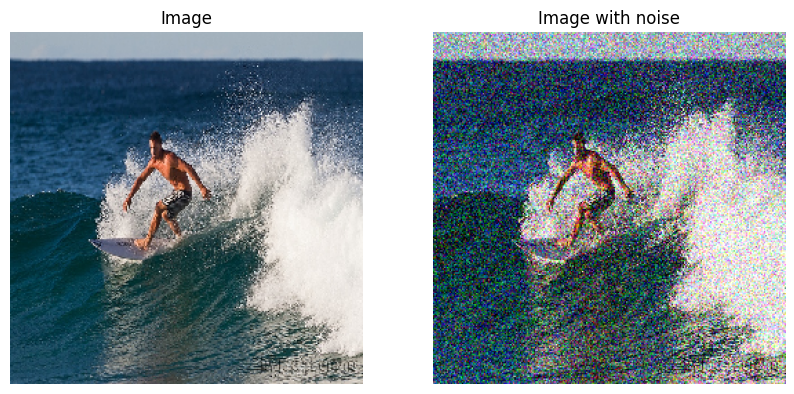

In [ ]:
image = open_images(["/content/drive/MyDrive/Datasetf/noisy_001.jpg"])
noise_img = add_noise(image, amount=0.2)

fig = plt.figure(figsize=(10, 5))
# Plot Image original
fig.add_subplot(1, 2, 1)
plt.axis('off')
plt.title('Image')
plt.imshow(image[0])
# Plot Image with noise
fig.add_subplot(1, 2, 2)
plt.axis('off')
plt.title('Image with noise')
plt.imshow(noise_img[0])

plt.show()



# Data Generator for Noisy and Real Images

The following function, `datagen`, is designed to generate batches of images that include both noisy and original images. This is particularly useful for training machine learning models, especially in scenarios where noise is introduced to improve model robustness.

In [ ]:
def datagen(paths, size=256, batch_size=10):
    '''
    Given an array of images to paths,
    this function returns batch of images as (noise_image, real_image)
    '''
    for x in range(0, len(paths), batch_size):
        batch_paths = paths[x:x+batch_size]
        batch_images = open_images(batch_paths, size=size)
        amount = random.uniform(0,0.2) # Amount of noise = random value between 0 and 0.2
        noise_images = add_noise(batch_images, amount=amount)
        yield noise_images, batch_images



# Enhanced Autoencoder Architecture for Image Denoising

## Overview

This enhanced autoencoder architecture is designed for image denoising, featuring a bottleneck and utilizing the Structural Similarity Index (SSIM) as the loss function to improve reconstruction quality.

## Architecture Components

### 1. Input Layer
- Accepts images of size `(256, 256, 3)`.

### 2. Encoder
- **Convolutional Layers**: Use `64` and `128` filters to extract features.
- **Batch Normalization**: Stabilizes and accelerates training.
- **Max Pooling Layers**: Reduces spatial dimensions, focusing on essential features.
- Outputs a compressed representation of the input.

### 3. Decoder
- Mirrors the encoder structure:
  - **UpSampling Layers**: Increase spatial dimensions.
  - **Final Convolutional Layer**: Outputs a reconstructed image with `3` filters and a sigmoid activation function.

### 4. Loss Function
- **SSIM Loss**: Maximizes structural similarity between original and reconstructed images, focusing on preserving key details.

### 5. Compilation
- **Optimizer**: Adam with a learning rate of `0.0001`.
- **Loss**: SSIM loss for training.
- **Metrics**: Accuracy for performance monitoring.




***************************************************************************

In [ ]:
from tensorflow.keras.layers import BatchNormalization
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dense, Flatten, Reshape, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Fonction de perte SSIM
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

input_img = Input(shape=(256, 256, 3))

# Encodeur
x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# Décodeur
x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
x = BatchNormalization()(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

# Compilation du modèle
autoencoderr = Model(input_img, decoded)
autoencoderr.compile(optimizer=Adam(learning_rate=0.0001), loss=ssim_loss, metrics=['accuracy'])


## Benefits
- **Improved Feature Learning**: Richer features through increased filters.
- **Structural Preservation**: SSIM loss retains important image details.
- **Robust Training**: Bottleneck architecture enhances noise resistance.

In summary, this enhanced autoencoder effectively learns to denoise images while preserving crucial structural information, making it a robust solution for image denoising tasks.

In [ ]:
autoencoderr.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 128, 128, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 256, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 256, 256, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 300,291 (1.15 MB)

 Trainable params: 299,523 (1.14 MB)

 Non-trainable params: 768 (3.00 KB)

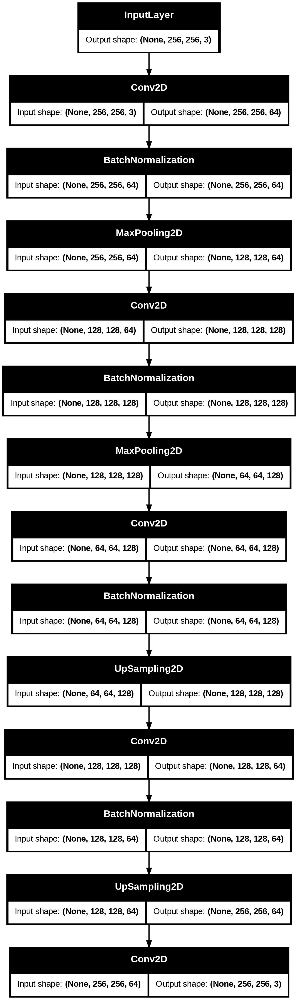

In [ ]:
from tensorflow.keras.utils import plot_model
!pip install pydot
plot_model(autoencoderr, to_file="cnn_denoise_model.png", show_shapes=True)

# Training the Autoencoder Model

In this section, we train the enhanced autoencoder model on the noisy image dataset, using a defined number of epochs and batch size. The training process includes evaluation on both training and validation datasets to monitor the model's performance.

47/47 ━━━━━━━━━━━━━━━━━━━━ 44s 351ms/step - accuracy: 0.4554 - loss: 0.7600 - val_accuracy: 0.2937 - val_loss: 0.6316
Epoch 1/50 - loss: 0.6452 - accuracy: 0.5025 - val_loss: 0.6316 - val_accuracy: 0.2937
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - accuracy: 0.5785 - loss: 0.4493 - val_accuracy: 0.2601 - val_loss: 0.6243
Epoch 2/50 - loss: 0.4218 - accuracy: 0.6026 - val_loss: 0.6243 - val_accuracy: 0.2601
47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 310ms/step - accuracy: 0.6012 - loss: 0.3938 - val_accuracy: 0.2550 - val_loss: 0.6069
Epoch 3/50 - loss: 0.3791 - accuracy: 0.6180 - val_loss: 0.6069 - val_accuracy: 0.2550
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - accuracy: 0.6128 - loss: 0.3653 - val_accuracy: 0.2881 - val_loss: 0.5903
Epoch 4/50 - loss: 0.3533 - accuracy: 0.6313 - val_loss: 0.5903 - val_accuracy: 0.2881
47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - accuracy: 0.6219 - loss: 0.3559 - val_accuracy: 0.4135 - val_loss: 0.5632
Epoch 5/50 - loss: 0.3412 - accuracy: 0.6416 - val_loss: 0.5632 

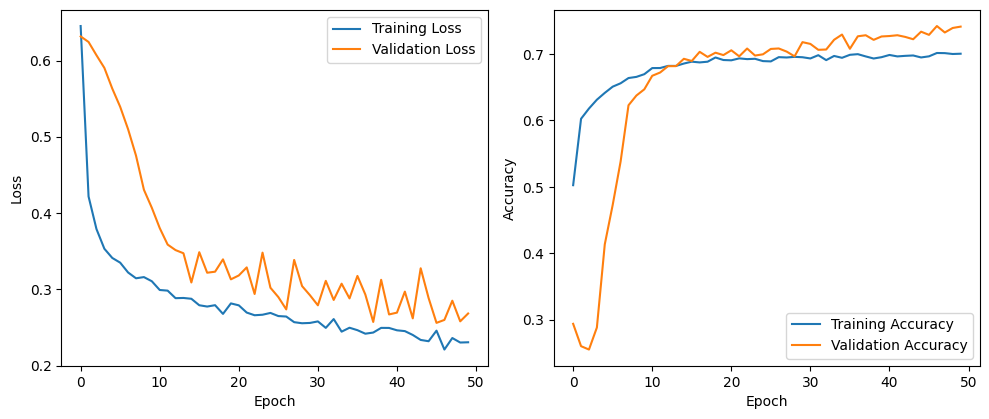

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.7432 - loss: 0.2640


[0.2707121968269348, 0.7473503947257996]

In [ ]:
batch_size = 10
steps_train = int(len(train_image_paths) / batch_size)
steps_val = int(len(val_image_paths) / batch_size)
epochs = 50

losses = []  # Pour stocker les valeurs de loss pour l'ensemble d'entraînement
accuracies = []  # Pour stocker les valeurs d'accuracy pour l'ensemble d'entraînement
val_losses = []  # Pour stocker les valeurs de loss pour l'ensemble de validation
val_accuracies = []  # Pour stocker les valeurs d'accuracy pour l'ensemble de validation

for epoch in range(epochs):
    # Entraînement du modèle avec validation
    history = autoencoderr.fit(
        datagen(train_image_paths, size=256, batch_size=batch_size),
        epochs=1,
        steps_per_epoch=steps_train,
        validation_data=datagen(val_image_paths, size=256, batch_size=batch_size),
        validation_steps=steps_val
    )

    # Évaluez le modèle pour obtenir la perte (loss) et l'accuracy
    loss = history.history['loss'][0]
    accuracy = history.history['accuracy'][0]
    val_loss = history.history['val_loss'][0]  # Loss pour l'ensemble de validation
    val_accuracy = history.history['val_accuracy'][0]  # Accuracy pour l'ensemble de validation

    # Stockage des métriques
    losses.append(loss)
    accuracies.append(accuracy)
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch + 1}/{epochs} - loss: {loss:.4f} - accuracy: {accuracy:.4f} - val_loss: {val_loss:.4f} - val_accuracy: {val_accuracy:.4f}")

# Affichez les métriques sous forme de graphique
plt.figure(figsize=(10, 8))

# Loss
plt.subplot(2, 2, 1)
plt.plot(losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy
plt.subplot(2, 2, 2)
plt.plot(accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Évaluation sur l'ensemble de test
steps_test = int(len(test_image_paths) / batch_size)
autoencoderr.evaluate(datagen(test_image_paths, size=256, batch_size=batch_size), steps=steps_test)


## Detailed Interpretation of Training and Validation Results

In this analysis, we will closely examine the training and validation results of the autoencoder model for image denoising over 50 epochs, focusing on the loss and accuracy metrics.

**Initial Performance**: The model starts with a training accuracy of 45.54% and a validation accuracy of 29.37%. The initial loss is relatively high, suggesting that the model is just beginning to learn the patterns in the data.

**Improvement Over Epochs**: As training progresses, the model's accuracy improves gradually. By Epoch 7, the validation accuracy reaches around 53.81%, showing that the model is learning the data's patterns better.

**Sustained Growth**: From Epochs 8 to 15, the validation accuracy continues to increase, reaching around 69%. There is a significant improvement in the training loss and accuracy, indicating that the model is fitting the training data well.

**Oscillations in Accuracy**: Even as the accuracy improves overall, there are some fluctuations where the validation accuracy goes up and down between epochs. This may be due to noise in the validation data or small overfitting issues.

**Plateauing Trend**: By around Epoch 30, the model's performance seems to reach a plateau. There are still small increases, but the changes are less dramatic.

## Visualization of Denoising Results

In this section, we will detail the code that is used to visualize the performance of the trained autoencoder in reconstructing images from their noisy counterparts.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


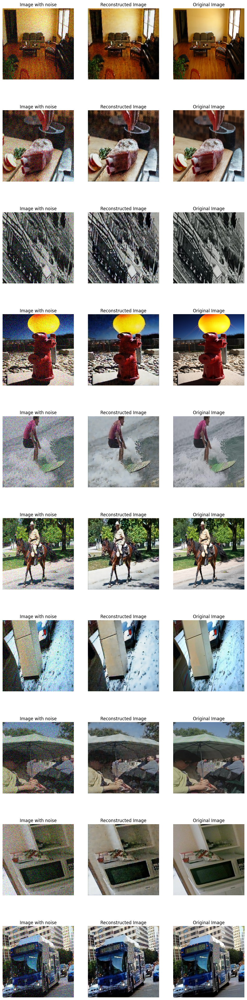

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Fonction pour afficher les résultats
def plot_results(noise_images, reconstructed_images, original_images):
    w = 12
    h = len(noise_images) * 5
    fig = plt.figure(figsize=(w, h))
    columns = 3
    rows = len(noise_images)

    for i in range(rows):
        # Afficher l'image avec bruit
        fig.add_subplot(rows, columns, i * columns + 1)
        plt.axis('off')
        plt.title('Image with noise')
        plt.imshow(noise_images[i])

        # Afficher l'image reconstruite
        fig.add_subplot(rows, columns, i * columns + 2)
        plt.axis('off')
        plt.title('Reconstructed Image')
        plt.imshow(reconstructed_images[i])

        # Afficher l'image originale
        fig.add_subplot(rows, columns, i * columns + 3)
        plt.axis('off')
        plt.title('Original Image')
        plt.imshow(original_images[i])

    plt.show()

# Paramètres
batch_size = 10

# Sélection aléatoire de chemins d'images depuis les images de test
paths = random.sample(test_image_paths, batch_size)

# Ouvrir les images à partir des chemins sélectionnés
images = open_images(paths, size=256)

# Ajouter du bruit avec une quantité aléatoire entre 0.1 et 0.15
amount = random.uniform(0.1, 0.15)
noise_images = add_noise(images, amount=amount)

# Reconstruire les images avec l'autoencoder
reconstructed_images = autoencoderr.predict(noise_images)

# Afficher les résultats
plot_results(noise_images, reconstructed_images, images)


## Implementation of CAE


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, UpSampling2D, Flatten, Dense, Reshape, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np

# Définir l'input de l'autoencodeur
encoder_input = Input(shape=(256, 256, 3))

# Encoder
x = Conv2D(64, (3, 3), activation='relu', padding='same')(encoder_input)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
encoded = MaxPooling2D(pool_size=(2, 2), padding='same')(x)

x = Dropout(0.4)(encoded)  # Ajouter Dropout pour régularisation

# Latent space
x = Flatten()(x)
latent_space = Dense(64, activation='relu', name='latent_space')(x)

# Decoder
x = Dense(np.prod(encoded.shape[1:]), activation='relu')(latent_space)
x = Reshape(encoded.shape[1:])(x)  # Remodeler en la forme (None, height, width, channels)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D()(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D()(x)

x = Dropout(0.4)(x)  # Ajouter Dropout également dans le décodeur

# Sortie décodée
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

# Modèle
autoencoder = Model(encoder_input, decoded, name='Denoising_Model')
autoencoder.summary()
optimizer = Adam(learning_rate=0.0001)
# Compilation du modèle
autoencoder.compile(loss='mean_absolute_error', optimizer=optimizer)

# Callbacks
early_stopping = EarlyStopping(
    monitor='loss',
    patience=10,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6
)




Model: "Denoising_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 262144)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ latent_space (Dense)                 │ (None, 64)                  │      16,777,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 262144)              │      17,039,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 33,884,707 (129.26 MB)

 Trainable params: 33,884,323 (129.26 MB)

 Non-trainable params: 384 (1.50 KB)

This autoencoder model is designed for image denoising. It consists of an encoder that compresses the input image into a lower-dimensional latent space and a decoder that reconstructs the original image from this compressed representation.

**Encoder:**

The input shape is (256, 256, 3), representing a 256x256 RGB image.

It uses two convolutional layers with 64 filters each, followed by batch normalization to stabilize training, and max pooling layers to reduce the spatial dimensions.

Dropout (0.4) is applied for regularization to prevent overfitting by randomly setting a fraction of the inputs to zero.

**Latent Space:**
The output from the encoder is flattened, and a dense layer reduces it to a latent space representation of 64 dimensions, capturing the essential features.

**Decoder:**

The decoder starts by reshaping the latent space back to the shape of the encoded features.
It then uses two convolutional layers with 32 filters, batch normalization, and upsampling layers to gradually reconstruct the original image dimensions.
Another dropout layer (0.4) is included to enhance the robustness of the model.

**Output:**

The final output is a convolutional layer with a sigmoid activation function, producing the denoised image with values normalized between 0 and 1.
The model is compiled with the Adam optimizer (learning rate of 0.0001) and uses mean absolute error (MAE) as the loss function to measure the difference between the original and reconstructed images.

94/94 ━━━━━━━━━━━━━━━━━━━━ 33s 178ms/step - loss: 0.2558 - val_loss: 0.2293 - learning_rate: 1.0000e-04
Epoch 1/50 - loss: 0.2321 - val_loss: 0.2293 
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1957 - val_loss: 0.2667 - learning_rate: 1.0000e-04
Epoch 2/50 - loss: 0.1870 - val_loss: 0.2667 
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1729 - val_loss: 0.3041 - learning_rate: 1.0000e-04
Epoch 3/50 - loss: 0.1669 - val_loss: 0.3041 
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1591 - val_loss: 0.2765 - learning_rate: 1.0000e-04
Epoch 4/50 - loss: 0.1543 - val_loss: 0.2765 
94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 167ms/step - loss: 0.1503 - val_loss: 0.2271 - learning_rate: 1.0000e-04
Epoch 5/50 - loss: 0.1462 - val_loss: 0.2271 
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1442 - val_loss: 0.1824 - learning_rate: 1.0000e-04
Epoch 6/50 - loss: 0.1401 - val_loss: 0.1824 
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1383 - val_loss: 0.1482 - learning_rate: 1.0000e

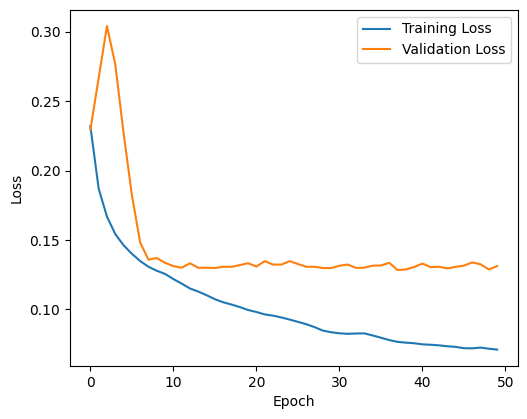

29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 138ms/step - loss: 0.1379


0.13520380854606628

In [ ]:
batch_size = 10
steps_train = int(len(train_image_paths) / batch_size)
steps_val = int(len(val_image_paths) / batch_size)
epochs = 50

losses = []  # Pour stocker les valeurs de loss pour l'ensemble d'entraînement
accuracies = []  # Pour stocker les valeurs d'accuracy pour l'ensemble d'entraînement
val_losses = []  # Pour stocker les valeurs de loss pour l'ensemble de validation
val_accuracies = []  # Pour stocker les valeurs d'accuracy pour l'ensemble de validation

for epoch in range(epochs):
    # Entraînement du modèle avec validation
    history = autoencoder.fit(
        datagen(train_image_paths, size=256, batch_size=batch_size),
        epochs=1,
        steps_per_epoch=steps_train,
        validation_data=datagen(val_image_paths, size=256, batch_size=batch_size),
        validation_steps=steps_val ,
        callbacks=[early_stopping, reduce_lr]
    )



    # Évaluez le modèle pour obtenir la perte (loss) et l'accuracy
    loss = history.history['loss'][0]
    val_loss = history.history['val_loss'][0]  # Loss pour l'ensemble de validation


    # Stockage des métriques
    losses.append(loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch + 1}/{epochs} - loss: {loss:.4f} - val_loss: {val_loss:.4f} ")

# Affichez les métriques sous forme de graphique
plt.figure(figsize=(10, 8))

# Loss
plt.subplot(2, 2, 1)
plt.plot(losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.tight_layout()
plt.show()

# Évaluation sur l'ensemble de test
steps_test = int(len(test_image_paths) / batch_size)
autoencoder.evaluate(datagen(test_image_paths, size=256, batch_size=batch_size), steps=steps_test)

**Observations**

**Loss Trend:**

The training loss generally decreases over the epochs, which is a good sign, indicating that the model is learning.
However, the validation loss fluctuates more significantly, with some epochs experiencing increases in val_loss after a decrease. This might suggest that the model is overfitting to the training data.

**Validation Loss Behavior:**

There are epochs where the validation loss increases, which is not ideal. Ideally, you want to see a consistent downward trend in both training and validation losses.
The validation loss reached its lowest value of 0.1284 at epoch 38 but then increased in subsequent epochs. This could indicate that your model is starting to memorize the training data rather than generalizing well to unseen data.

# Visualization of Training Loss and Accuracy

This code snippet visualizes the training loss and accuracy metrics over the epochs of training for the autoencoder model. The plots help to understand how well the model is performing during the training process.

## Utility of This Code

- **Performance Monitoring**: By visualizing training loss and accuracy, you can monitor the model's performance over time and check for issues like overfitting or underfitting.
- **Model Diagnosis**: The plots provide insights into whether the model is learning effectively. A decreasing loss and increasing accuracy indicate that the model is improving.
- **Visual Feedback**: The graphical representation makes it easier to interpret training dynamics than raw numeric values.


**PLOT RESULT**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


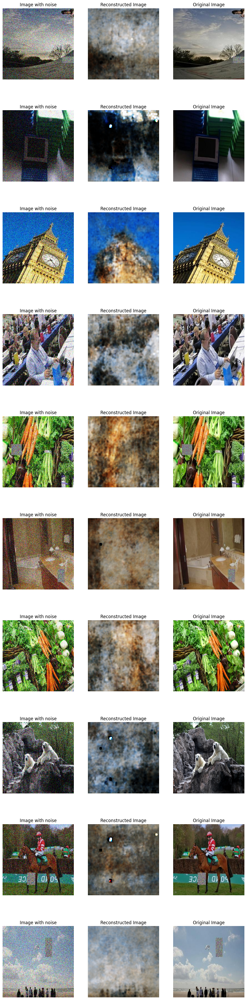

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Fonction pour afficher les résultats
def plot_results(noise_images, reconstructed_images, original_images):
    w = 12
    h = len(noise_images) * 5
    fig = plt.figure(figsize=(w, h))
    columns = 3
    rows = len(noise_images)

    for i in range(rows):
        # Afficher l'image avec bruit
        fig.add_subplot(rows, columns, i * columns + 1)
        plt.axis('off')
        plt.title('Image with noise')
        plt.imshow(noise_images[i])

        # Afficher l'image reconstruite
        fig.add_subplot(rows, columns, i * columns + 2)
        plt.axis('off')
        plt.title('Reconstructed Image')
        plt.imshow(reconstructed_images[i])

        # Afficher l'image originale
        fig.add_subplot(rows, columns, i * columns + 3)
        plt.axis('off')
        plt.title('Original Image')
        plt.imshow(original_images[i])

    plt.show()

# Paramètres
batch_size = 10

# Sélection aléatoire de chemins d'images depuis les images de test
paths = random.sample(test_image_paths, batch_size)

# Ouvrir les images à partir des chemins sélectionnés
images = open_images(paths, size=256)

# Ajouter du bruit avec une quantité aléatoire entre 0.1 et 0.15
amount = random.uniform(0.1, 0.15)
noise_images = add_noise(images, amount=amount)

# Reconstruire les images avec l'autoencoder
reconstructed_images = autoencoder.predict(noise_images)

# Afficher les résultats
plot_results(noise_images, reconstructed_images, images)

The **first model** maintains a simpler and more straightforward encoder-decoder architecture, which helps preserve image details by decomposing the information in a hierarchical manner using convolutional and pooling layers. In contrast, the second model, with its use of a latent space and the Flatten layer, loses the spatial structure of the images, making it more challenging to faithfully reconstruct the original image. For image denoising, maintaining the spatial structure is crucial for accurately recovering fine details.

***An exemple of the first model***

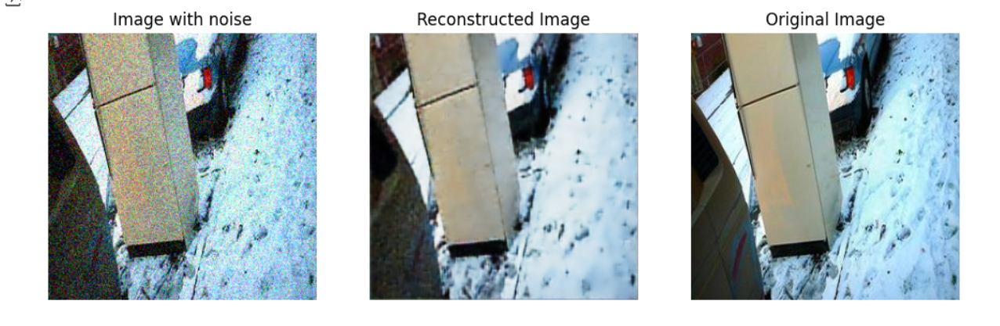

***An exemple of the second model***

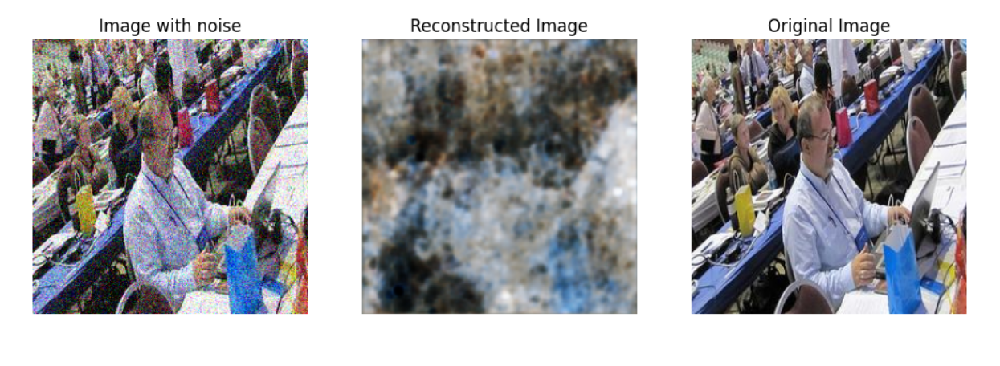

**Improvements**

Apart from this, it is still possible to further optimize the results as well as our model. The image appears softened and loses color intensity in an effort to reduce noise. However, this approach results in a loss of quality in shapes and solid color areas, such as the ground or the sky.

To address this, we should consider training our model on a larger volume of images, increasing the image resolution, and continuing intensive training of the model. However, a major issue is the limited GPU quota, which interrupts the process of creating complex models and hampers the training of larger networks.

It is also worth exploring solutions like "keras-tuner" or "talos" over an extended period, allowing for the automated search and discovery of the best possible parameter combinations.

By implementing these solutions, our model should be able to achieve even more promising results.






